# **Exploratory Data Analysis (EDA)**

Exploratory Data Analysis (EDA) is an approach to analyzing datasets to summarize their main characteristics, often with visual methods. Before applying any machine learning algorithms, it's essential to explore the data to understand its structure, anomalies, patterns, and relationships.

**Purpose of EDA**


*   Understanding Data: Get a feel of the dataset, understand its structure, and the type of data.
*   Identifying Patterns and Relationships: Understand the relationships between different variables.
*   Spotting Anomalies: Detect any outliers or anomalies in the dataset.
*   Formulating Assumptions and Hypotheses: For further analysis or modeling.


**Steps in EDA**

1. Data Collection: Gather the raw data.
2. Data Cleaning: Handle missing data, detect and remove outliers, and deal with duplicate data.
3. Data Visualization: Use charts and graphs to visualize distributions and relationships.
4. Statistical Analysis: Generate insights from the dataset using statistical methods.

# **Loading the Dataset**

In [1]:
import pandas as pd
import numpy as np

from google.colab import files
uploaded = files.upload()

# Load the dataset
data = pd.read_csv('uber_pickups_nyc.csv')

# Display the first few rows to understand the structure
data.head()

Saving uber_pickups_nyc.csv to uber_pickups_nyc.csv


,pickup_dt,borough,pickups,spd,vsb,temp,dewp,slp,pcp01,pcp06,pcp24,sd,hday
0,2015-01-01 01:00:00,Bronx,152,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,0.0,Y
1,2015-01-01 01:00:00,Brooklyn,1519,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,0.0,Y
2,2015-01-01 01:00:00,EWR,0,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,0.0,Y
3,2015-01-01 01:00:00,Manhattan,5258,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,0.0,Y
4,2015-01-01 01:00:00,Queens,405,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,0.0,Y


In [2]:
# Check the dimensions of the dataset
shape = data.shape

# View the first few rows of the dataset
head = data.head()

# Get summary statistics
describe = data.describe(include='all')

shape, head, describe

((29101, 13),
              pickup_dt    borough  pickups  spd   vsb  temp  dewp     slp  \
 0  2015-01-01 01:00:00      Bronx      152  5.0  10.0  30.0   7.0  1023.5   
 1  2015-01-01 01:00:00   Brooklyn     1519  5.0  10.0  30.0   7.0  1023.5   
 2  2015-01-01 01:00:00        EWR        0  5.0  10.0  30.0   7.0  1023.5   
 3  2015-01-01 01:00:00  Manhattan     5258  5.0  10.0  30.0   7.0  1023.5   
 4  2015-01-01 01:00:00     Queens      405  5.0  10.0  30.0   7.0  1023.5   
 
    pcp01  pcp06  pcp24   sd hday  
 0    0.0    0.0    0.0  0.0    Y  
 1    0.0    0.0    0.0  0.0    Y  
 2    0.0    0.0    0.0  0.0    Y  
 3    0.0    0.0    0.0  0.0    Y  
 4    0.0    0.0    0.0  0.0    Y  ,
                   pickup_dt borough       pickups           spd           vsb  \
 count                 29101   26058  29101.000000  29101.000000  29101.000000   
 unique                 4343       6           NaN           NaN           NaN   
 top     2015-01-01 01:00:00   Bronx           NaN   

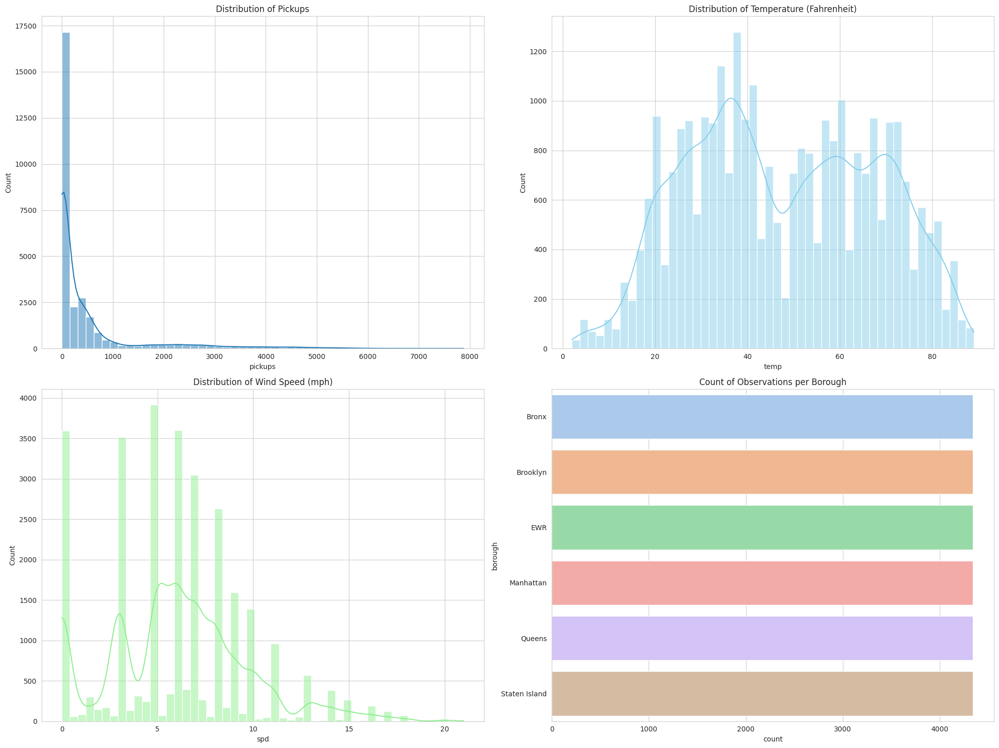

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the aesthetics for the plots
sns.set_style("whitegrid")
plt.figure(figsize=(20, 15))

# Plotting the distribution of pickups
plt.subplot(2, 2, 1)
sns.histplot(data['pickups'], bins=50, kde=True)
plt.title('Distribution of Pickups')

# Plotting the distribution of temperature
plt.subplot(2, 2, 2)
sns.histplot(data['temp'], bins=50, kde=True, color='skyblue')
plt.title('Distribution of Temperature (Fahrenheit)')

# Plotting the distribution of wind speed
plt.subplot(2, 2, 3)
sns.histplot(data['spd'], bins=50, kde=True, color='lightgreen')
plt.title('Distribution of Wind Speed (mph)')

# Plotting the count of pickups per borough
plt.subplot(2, 2, 4)
sns.countplot(data=data, y='borough', order=data['borough'].value_counts().index, palette='pastel')
plt.title('Count of Observations per Borough')

plt.tight_layout()
plt.show()


In [4]:
# Checking for missing data
missing_data = data.isnull().sum()
missing_percentage = (data.isnull().sum() / len(data)) * 100

missing_info = pd.DataFrame({
    'Missing Values': missing_data,
    'Percentage (%)': missing_percentage
})

missing_info.sort_values(by='Percentage (%)', ascending=False)


,Missing Values,Percentage (%)
borough,3043,10.456685
pickup_dt,0,0.000000
pickups,0,0.000000
spd,0,0.000000
vsb,0,0.000000
temp,0,0.000000
dewp,0,0.000000
slp,0,0.000000
pcp01,0,0.000000
pcp06,0,0.000000


In [5]:
# Replacing missing values in 'borough' with "Not specified"
data['borough'].fillna('Not specified', inplace=True)

# Checking if there are any more missing values left
remaining_missing = data['borough'].isnull().sum()

remaining_missing


0

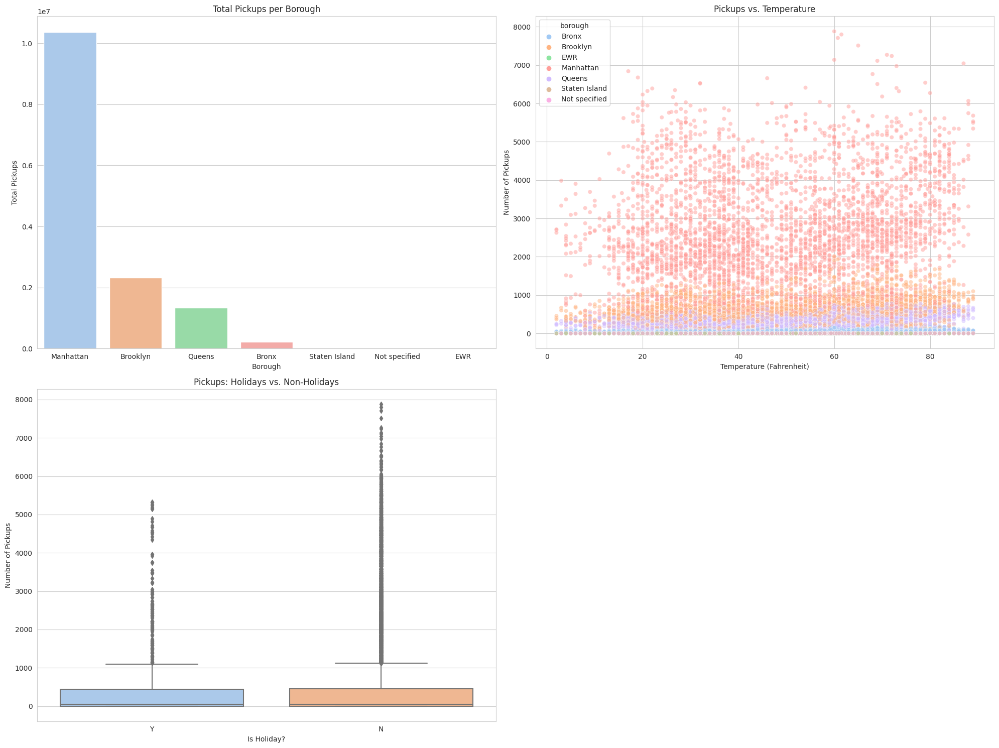

In [6]:
# Setting up the aesthetics for the plots
plt.figure(figsize=(20, 15))

# Plotting borough-wise total pickups
plt.subplot(2, 2, 1)
borough_pickups = data.groupby('borough')['pickups'].sum().sort_values(ascending=False)
sns.barplot(x=borough_pickups.index, y=borough_pickups.values, palette='pastel')
plt.title('Total Pickups per Borough')
plt.ylabel('Total Pickups')
plt.xlabel('Borough')

# Plotting the relationship between pickups and temperature
plt.subplot(2, 2, 2)
sns.scatterplot(data=data, x='temp', y='pickups', hue='borough', palette='pastel', alpha=0.5)
plt.title('Pickups vs. Temperature')
plt.ylabel('Number of Pickups')
plt.xlabel('Temperature (Fahrenheit)')

# Plotting pickups during holidays vs. non-holidays
plt.subplot(2, 2, 3)
sns.boxplot(data=data, x='hday', y='pickups', palette='pastel')
plt.title('Pickups: Holidays vs. Non-Holidays')
plt.ylabel('Number of Pickups')
plt.xlabel('Is Holiday?')

plt.tight_layout()
plt.show()


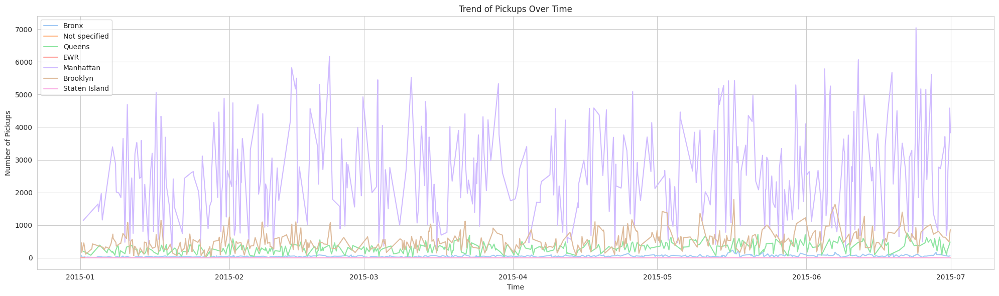

In [7]:
# Parsing the 'pickup_dt' column to datetime format for time series analysis
data['pickup_dt'] = pd.to_datetime(data['pickup_dt'])

# Plotting the trend of pickups over time
plt.figure(figsize=(20, 6))
data_sample = data.sample(frac=0.1)  # Sampling a fraction of data for better visualization
sns.lineplot(data=data_sample, x='pickup_dt', y='pickups', hue='borough', palette='pastel')
plt.title('Trend of Pickups Over Time')
plt.ylabel('Number of Pickups')
plt.xlabel('Time')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


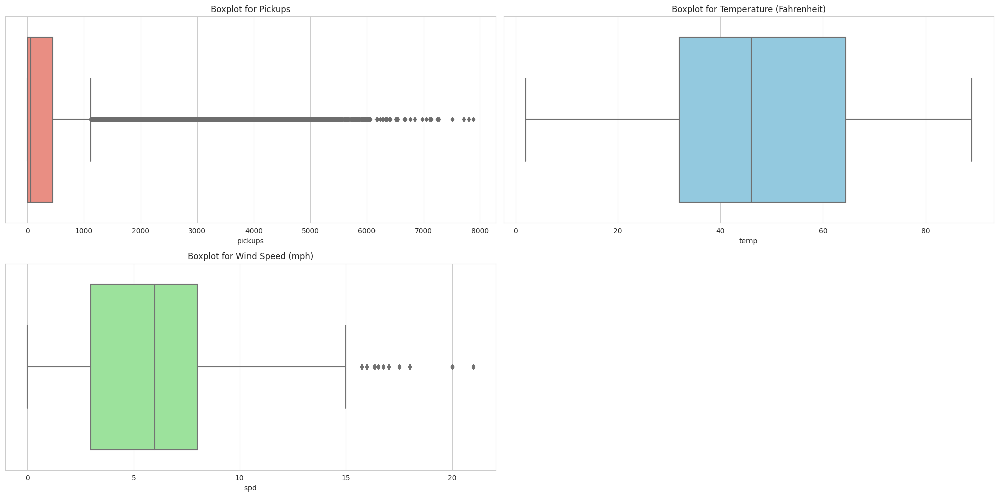

In [8]:
# Setting up the aesthetics for the plots
plt.figure(figsize=(20, 10))

# Boxplot for 'pickups'
plt.subplot(2, 2, 1)
sns.boxplot(x=data['pickups'], color='salmon')
plt.title('Boxplot for Pickups')

# Boxplot for 'temp'
plt.subplot(2, 2, 2)
sns.boxplot(x=data['temp'], color='skyblue')
plt.title('Boxplot for Temperature (Fahrenheit)')

# Boxplot for 'spd'
plt.subplot(2, 2, 3)
sns.boxplot(x=data['spd'], color='lightgreen')
plt.title('Boxplot for Wind Speed (mph)')

plt.tight_layout()
plt.show()


In [9]:
# Calculating Q1 and Q3
Q1 = data['pickups'].quantile(0.25)
Q3 = data['pickups'].quantile(0.75)

# Calculating IQR
IQR = Q3 - Q1

# Determining bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifying outliers
outliers = data[(data['pickups'] < lower_bound) | (data['pickups'] > upper_bound)]

# Number of outliers and percentage
num_outliers = outliers.shape[0]
percentage_outliers = (num_outliers / data.shape[0]) * 100

num_outliers, percentage_outliers


(3498, 12.020205491220233)

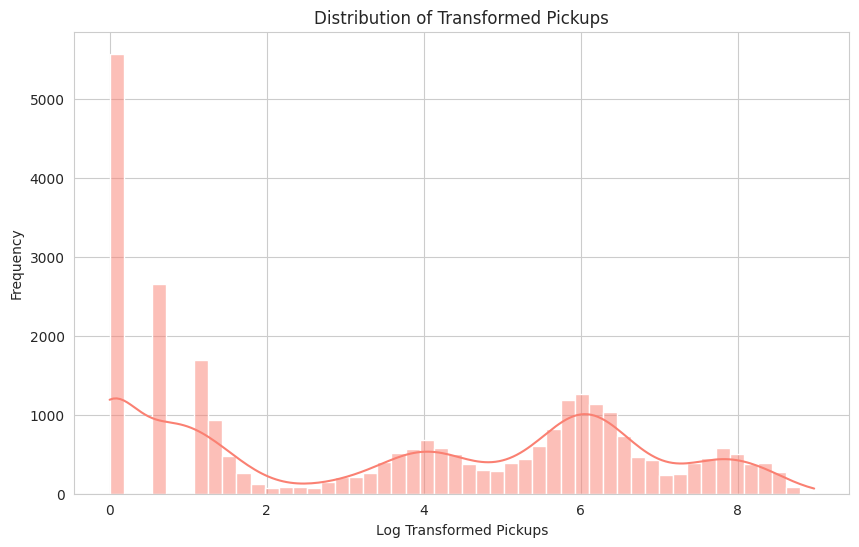

In [10]:
import numpy as np

# Applying log transformation
data['transformed_pickups'] = np.log1p(data['pickups'])

# Visualizing the distribution of the transformed pickups
plt.figure(figsize=(10, 6))
sns.histplot(data['transformed_pickups'], bins=50, kde=True, color='salmon')
plt.title('Distribution of Transformed Pickups')
plt.xlabel('Log Transformed Pickups')
plt.ylabel('Frequency')
plt.show()


# **Feature Engineering and Processing**

In [11]:
# Extracting time-based features from 'pickup_dt'
data['hour'] = data['pickup_dt'].dt.hour
data['day'] = data['pickup_dt'].dt.day
data['month'] = data['pickup_dt'].dt.month
data['day_of_week'] = data['pickup_dt'].dt.dayofweek  # Monday=0, Sunday=6

# Creating interaction features (just an example, more can be created based on domain knowledge)
data['temp_spd_interaction'] = data['temp'] * data['spd']

# Previewing the dataset with the new features
data[['pickup_dt', 'hour', 'day', 'month', 'day_of_week', 'temp_spd_interaction']].head()


,pickup_dt,hour,day,month,day_of_week,temp_spd_interaction
0,2015-01-01 01:00:00,1,1,1,3,150.0
1,2015-01-01 01:00:00,1,1,1,3,150.0
2,2015-01-01 01:00:00,1,1,1,3,150.0
3,2015-01-01 01:00:00,1,1,1,3,150.0
4,2015-01-01 01:00:00,1,1,1,3,150.0


In [12]:
# One-hot encoding 'borough' and 'hday' columns
data_encoded = pd.get_dummies(data, columns=['borough', 'hday'])

# Previewing the dataset after one-hot encoding
data_encoded.head()


,pickup_dt,pickups,spd,vsb,temp,dewp,slp,pcp01,pcp06,pcp24,...,temp_spd_interaction,borough_Bronx,borough_Brooklyn,borough_EWR,borough_Manhattan,borough_Not specified,borough_Queens,borough_Staten Island,hday_N,hday_Y
0,2015-01-01 01:00:00,152,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,...,150.0,1,0,0,0,0,0,0,0,1
1,2015-01-01 01:00:00,1519,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,...,150.0,0,1,0,0,0,0,0,0,1
2,2015-01-01 01:00:00,0,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,...,150.0,0,0,1,0,0,0,0,0,1
3,2015-01-01 01:00:00,5258,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,...,150.0,0,0,0,1,0,0,0,0,1
4,2015-01-01 01:00:00,405,5.0,10.0,30.0,7.0,1023.5,0.0,0.0,0.0,...,150.0,0,0,0,0,0,1,0,0,1


In [13]:
from sklearn.preprocessing import MinMaxScaler

# Identifying numerical features to scale
numerical_features = ['pickups', 'spd', 'vsb', 'temp', 'dewp', 'slp', 'pcp01', 'pcp06', 'pcp24', 'sd', 'transformed_pickups', 'temp_spd_interaction']

# Applying Min-Max scaling
scaler = MinMaxScaler()
data_encoded[numerical_features] = scaler.fit_transform(data_encoded[numerical_features])

# Previewing the dataset after scaling
data_encoded[numerical_features].head()


,pickups,spd,vsb,temp,dewp,slp,pcp01,pcp06,pcp24,sd,transformed_pickups,temp_spd_interaction
0,0.019282,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.0,0.0,0.560645,0.125
1,0.192693,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.0,0.0,0.816538,0.125
2,0.000000,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.0,0.0,0.000000,0.125
3,0.667005,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.0,0.0,0.954874,0.125
4,0.051376,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.0,0.0,0.669411,0.125


In [14]:
from sklearn.feature_selection import VarianceThreshold

# Applying variance thresholding
selector = VarianceThreshold(threshold=0.01)


In [15]:
# Excluding the 'pickup_dt' column
data_for_thresholding = data_encoded.drop(columns=['pickup_dt'])

# Applying variance thresholding
selector.fit(data_for_thresholding)

# Features retained
features_retained = data_for_thresholding.columns[selector.get_support()]

# Features dropped
features_dropped = data_for_thresholding.columns[~selector.get_support()]

features_retained, features_dropped


(Index(['pickups', 'spd', 'vsb', 'temp', 'dewp', 'slp', 'pcp24', 'sd',
        'transformed_pickups', 'hour', 'day', 'month', 'day_of_week',
        'temp_spd_interaction', 'borough_Bronx', 'borough_Brooklyn',
        'borough_EWR', 'borough_Manhattan', 'borough_Not specified',
        'borough_Queens', 'borough_Staten Island', 'hday_N', 'hday_Y'],
       dtype='object'),
 Index(['pcp01', 'pcp06'], dtype='object'))

In [16]:
# Dropping irrelevant features
data_final = data_encoded.drop(columns=['pcp01', 'pcp06', 'pickup_dt'])

# Previewing the dataset after dropping columns
data_final.head()


,pickups,spd,vsb,temp,dewp,slp,pcp24,sd,transformed_pickups,hour,...,temp_spd_interaction,borough_Bronx,borough_Brooklyn,borough_EWR,borough_Manhattan,borough_Not specified,borough_Queens,borough_Staten Island,hday_N,hday_Y
0,0.019282,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.560645,1,...,0.125,1,0,0,0,0,0,0,0,1
1,0.192693,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.816538,1,...,0.125,0,1,0,0,0,0,0,0,1
2,0.000000,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.000000,1,...,0.125,0,0,1,0,0,0,0,0,1
3,0.667005,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.954874,1,...,0.125,0,0,0,1,0,0,0,0,1
4,0.051376,0.238095,1.0,0.321839,0.258427,0.617308,0.0,0.0,0.669411,1,...,0.125,0,0,0,0,0,1,0,0,1


# **Splitting the Data into Training and Testing Sets**

In [17]:
from sklearn.model_selection import train_test_split

# Features and target variable
X = data_final.drop(columns=['pickups', 'transformed_pickups'])  # Dropping 'pickups' and 'transformed_pickups' for features
y = data_final['pickups']

# Splitting the data into training and testing sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Displaying the shape of the training and testing sets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((23280, 21), (5821, 21), (23280,), (5821,))

In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Initializing the Linear Regression model
linear_model = LinearRegression()

# Training the model
linear_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_linear = linear_model.predict(X_test)

# Evaluating the model using Mean Squared Error (MSE)
mse_linear = mean_squared_error(y_test, y_pred_linear)

mse_linear


0.0050941947457890675

In [19]:
from sklearn.ensemble import RandomForestRegressor

# Initializing the Random Forest Regressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Training the model
rf_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluating the model using Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, y_pred_rf)

mse_rf


0.00045680891421219917

In [20]:
from sklearn.ensemble import GradientBoostingRegressor

# Initializing the Gradient Boosting Regressor model
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Training the model
gb_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_gb = gb_model.predict(X_test)

# Evaluating the model using Mean Squared Error (MSE)
mse_gb = mean_squared_error(y_test, y_pred_gb)

mse_gb


0.0012799623261367259

In [21]:
from sklearn.model_selection import RandomizedSearchCV

# Defining the hyperparameter space for Random Forest
param_dist = {
    'n_estimators': [10, 50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Using Random Search with cross-validation to find the best hyperparameters
random_search = RandomizedSearchCV(RandomForestRegressor(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=10,
                                   cv=3,
                                   scoring='neg_mean_squared_error',
                                   random_state=42,
                                   n_jobs=-1)

# Fitting the random search model
random_search.fit(X_train, y_train)

# Best hyperparameters
best_params = random_search.best_params_

# Training the Random Forest model with the best hyperparameters
best_rf_model = RandomForestRegressor(**best_params, random_state=42)
best_rf_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluating the model using Mean Squared Error (MSE)
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)

best_params, mse_best_rf


({'n_estimators': 100,
  'min_samples_split': 2,
  'min_samples_leaf': 1,
  'max_depth': 30},
 0.0004568931373632809)

In [22]:
!pip install -U ydata-profiling

In [23]:
import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.5 MB/s eta 0:00:00


In [24]:
from ydata_profiling import ProfileReport

In [25]:
report = ProfileReport(data)
report.to_notebook_iframe()
report.to_file(output_file="report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]